# **Latihan Mandiri 11 - DBSCAN**

Nama : Siti Nurhalizah

Nim  : 0110222224

## **Import Library**

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
import geopandas as gpd
!pip install contextily
import contextily as ctx
from mpl_toolkits.axes_grid1 import make_axes_locatable
from shapely import wkt

## **Load Dataset**

In [15]:
# menghubungkan colab dengan googe drive
from google.colab import drive
drive.mount('/content/grive')

Drive already mounted at /content/grive; to attempt to forcibly remount, call drive.mount("/content/grive", force_remount=True).


In [26]:
# membaca file csv menggunakan pandas
import pandas as pd
df = pd.read_csv("/content/grive/MyDrive/1.KULIAH/Semester 7/Machine Learning/praktikum11/data/data.csv", sep=';')
df.head()

,"date,time,latitude,longitude,depth,magnitude"
0,"2008-11-01,00:31:25,-0.6,98.89553,20.0,2.99"
1,"2008-11-01,01:34:29,-6.61,129.38722,30.1,5.51"
2,"2008-11-01,01:38:14,-3.65,127.99068,5.0,3.54"
3,"2008-11-01,02:20:05,-4.2,128.097,5.0,2.42"
4,"2008-11-01,02:32:18,-4.09,128.20047,10.0,2.41"


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87372 entries, 0 to 87371
Data columns (total 1 columns):
 #   Column                                        Non-Null Count  Dtype 
---  ------                                        --------------  ----- 
 0   date,time,latitude,longitude,depth,magnitude  87372 non-null  object
dtypes: object(1)
memory usage: 682.7+ KB


In [29]:
# Standarisasi nama kolom
df.columns = df.columns.str.lower().str.replace(" ", "_")

In [30]:
# Cek missing value
print(df.isnull().sum())

date,time,latitude,longitude,depth,magnitude    0
dtype: int64


In [31]:
# Ambil kolom numerik
num_cols = df.select_dtypes(include=[np.number]).columns

## **Exploratory Data Analysis (EDA)**

### **1. Visualisasi Heatmap Sebaran Gempa**

In [34]:
peta_heat = folium.Map(
    location=[-2.5, 118],
    zoom_start=5,
    tiles='cartodbpositron'
)

heat_data = df[['latitude', 'longitude']].dropna().values.tolist()

HeatMap(
    heat_data,
    radius=12,
    blur=18,
    max_zoom=6
).add_to(peta_heat)

peta_heat

### **2. Peta Sebaran Gempa dengan Basemap**

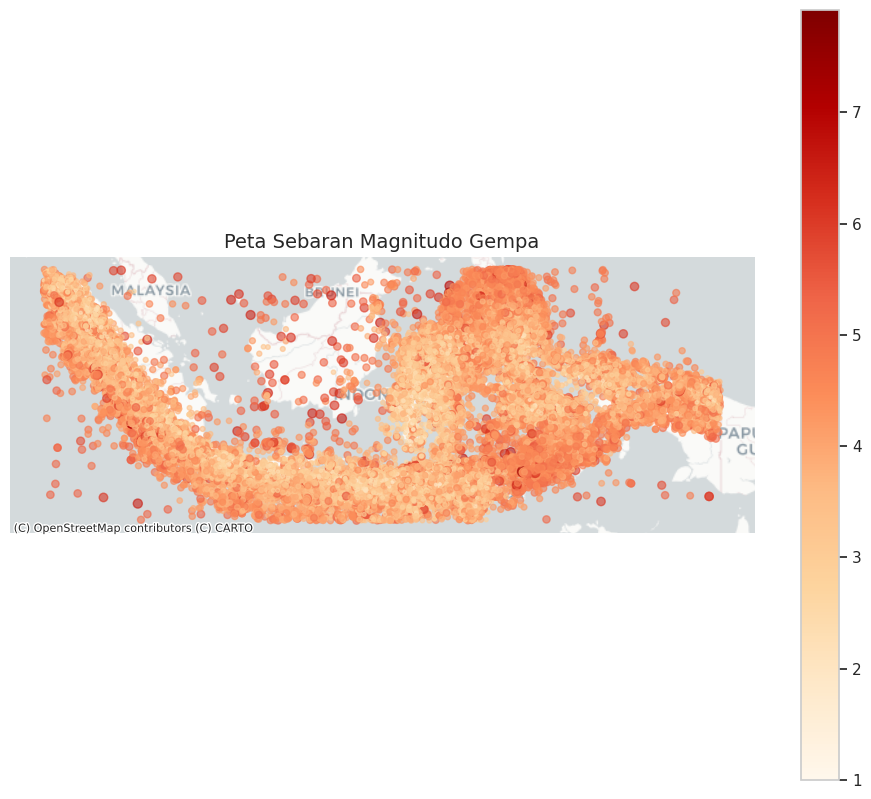

In [35]:
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df.longitude, df.latitude),
    crs='EPSG:4326'
).to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(12, 10))

gdf.plot(
    ax=ax,
    column='magnitude',
    cmap='OrRd',
    markersize=gdf['magnitude']**2,
    legend=True,
    alpha=0.6
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.set_title("Peta Sebaran Magnitudo Gempa", fontsize=14)
ax.axis('off')
plt.show()

### **3. Visualisasi Peta dan Grafik Bar**

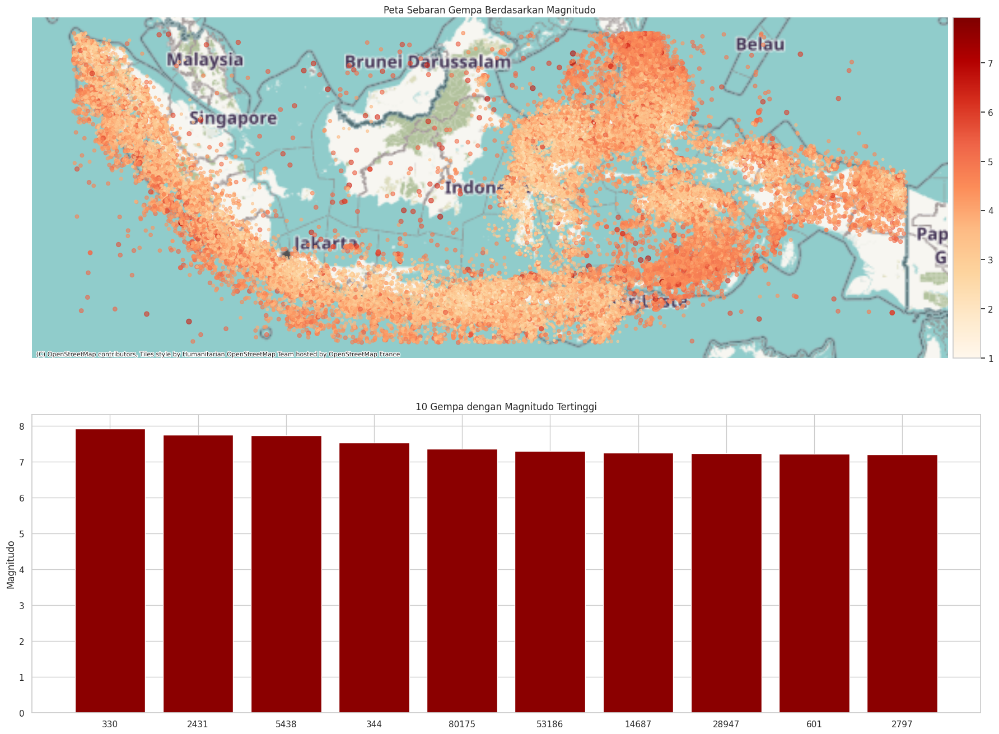

In [37]:
import matplotlib.gridspec as gridspec

top10 = df.sort_values('magnitude', ascending=False).head(10)

fig = plt.figure(figsize=(18, 14))
gs = gridspec.GridSpec(2, 1, height_ratios=[3, 2])

# MAP
ax_map = plt.subplot(gs[0])
divider = make_axes_locatable(ax_map)
cax = divider.append_axes("right", size="3%", pad=0.1)

gdf.plot(
    ax=ax_map,
    column='magnitude',
    cmap='OrRd',
    legend=True,
    cax=cax,
    markersize=gdf['magnitude']**2,
    alpha=0.6
)

ctx.add_basemap(ax_map)
ax_map.set_title("Peta Sebaran Gempa Berdasarkan Magnitudo")
ax_map.axis('off')

# BAR CHART
ax_bar = plt.subplot(gs[1])
ax_bar.bar(top10.index.astype(str), top10['magnitude'], color='darkred')
ax_bar.set_title("10 Gempa dengan Magnitudo Tertinggi")
ax_bar.set_ylabel("Magnitudo")

plt.tight_layout()
plt.show()

### **4. Visualisasi Rata-Rata Magnitude per Tahun**

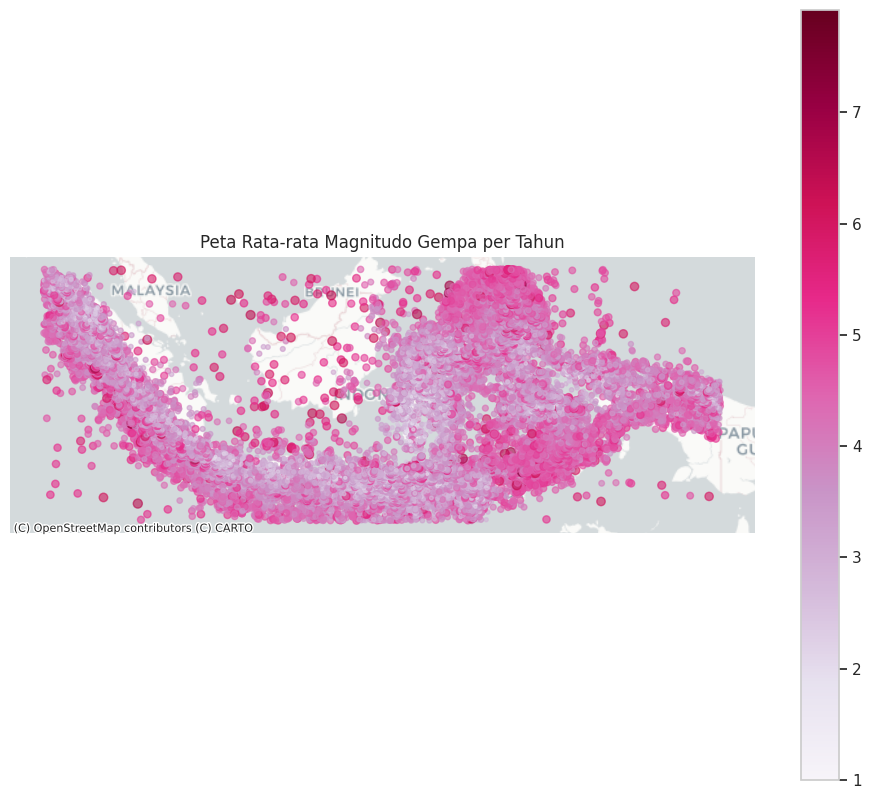

In [39]:
df['datetime'] = pd.to_datetime(df['date'] + ' ' + df['time'])
df['year'] = df['datetime'].dt.year

avg_year = df.groupby(['year', 'latitude', 'longitude'])['magnitude'].mean().reset_index()

gdf_year = gpd.GeoDataFrame(
    avg_year,
    geometry=gpd.points_from_xy(avg_year.longitude, avg_year.latitude),
    crs='EPSG:4326'
).to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(12, 10))

gdf_year.plot(
    ax=ax,
    column='magnitude',
    cmap='PuRd',
    markersize=gdf_year['magnitude']**2,
    legend=True,
    alpha=0.6
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.set_title("Peta Rata-rata Magnitudo Gempa per Tahun")
ax.axis('off')
plt.show()

## **Uji Normalitas**

In [41]:
features = ['latitude', 'longitude', 'depth', 'magnitude']
X = df[features]

In [43]:
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
X_scaled = scaler.fit_transform(X)

## **Menetukan Epsilon (K-DISTANCE GRAPH)**

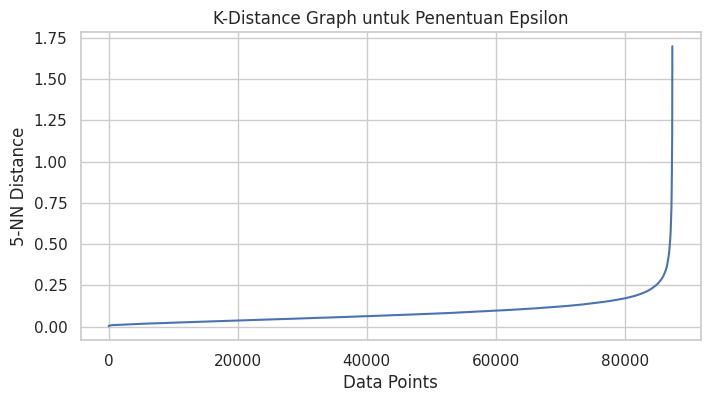

In [44]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(X_scaled)
distances, indices = neighbors_fit.kneighbors(X_scaled)

# Ambil jarak ke-k (k = min_samples)
k_distances = np.sort(distances[:, 4])

plt.figure(figsize=(8,4))
plt.plot(k_distances)
plt.xlabel("Data Points")
plt.ylabel("5-NN Distance")
plt.title("K-Distance Graph untuk Penentuan Epsilon")
plt.grid(True)
plt.show()

## **Clustering dengan DBSCAN**

In [45]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(X_scaled)

df['cluster'] = clusters
print(df['cluster'].value_counts())

cluster
 0    87124
-1      220
 2        9
 1        7
 3        7
 4        5
Name: count, dtype: int64


## **Evaluasi Clustering**

In [46]:
from sklearn.metrics import silhouette_score

labels = df['cluster'].unique()

if len(labels) > 2 and (-1 not in labels):
    sil_score = silhouette_score(X_scaled, clusters)
    print("Silhouette Score:", sil_score)
else:
    print("Silhouette Score tidak dapat dihitung (noise dominan atau cluster < 2)")

Silhouette Score tidak dapat dihitung (noise dominan atau cluster < 2)


## **Visualisasi Cluster dengan PCA**

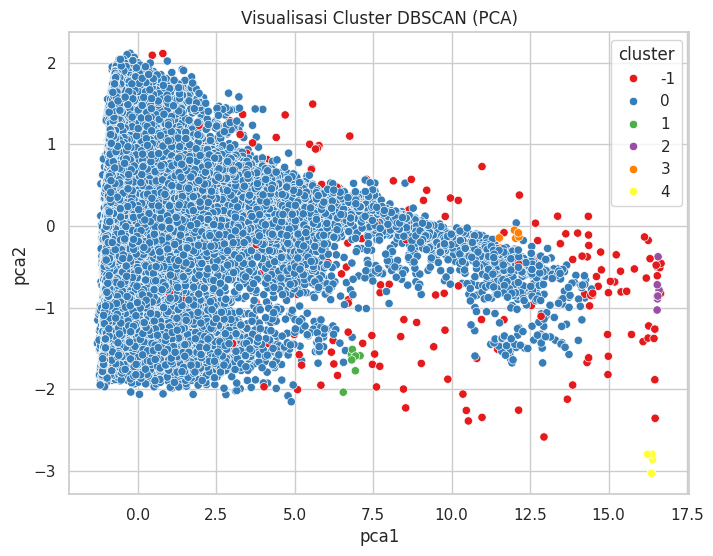

In [47]:
from sklearn.decomposition import PCA
import seaborn as sns

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

df['pca1'] = X_pca[:, 0]
df['pca2'] = X_pca[:, 1]

plt.figure(figsize=(8,6))
sns.scatterplot(
    x='pca1',
    y='pca2',
    hue='cluster',
    data=df,
    palette='Set1'
)
plt.title("Visualisasi Cluster DBSCAN (PCA)")
plt.show()

## **Pengelompokan Karakteristik Cluster**

In [48]:
cluster_summary = df.groupby('cluster')[features].mean()
print(cluster_summary)

         latitude   longitude       depth  magnitude
cluster                                             
-1      -2.051000  117.562971  387.874091   5.014000
 0      -3.419010  119.219488   47.465488   3.551992
 1      -2.761429  102.717021  340.500000   4.227143
 2      -3.115556  125.306882  750.000000   3.987778
 3      -6.938571  123.035767  542.285714   6.352857
 4      -0.162000   98.890508  748.960000   3.232000


## **Analisis Lanjutan per Cluster**

In [49]:
for c in sorted(df['cluster'].unique()):
    print(f"\nCluster {c}")
    display(df[df['cluster'] == c][features].describe())


Cluster -1


,latitude,longitude,depth,magnitude
count,220.00000,220.000000,220.000000,220.000000
mean,-2.05100,117.562972,387.874091,5.014000
std,4.72382,11.104087,227.751993,1.281045
min,-10.94000,95.563340,10.000000,1.080000
25%,-6.43250,108.497928,186.775000,4.107500
50%,-2.15500,120.159820,364.000000,5.050000
75%,1.98750,125.600737,610.175000,6.050000
max,5.95000,140.259320,750.000000,7.920000



Cluster 0


,latitude,longitude,depth,magnitude
count,87124.000000,87124.000000,87124.000000,87124.000000
mean,-3.419010,119.219488,47.465488,3.551992
std,4.341106,10.646914,73.069377,0.789048
min,-11.000000,95.002390,1.000000,1.000000
25%,-7.930000,114.017382,10.000000,2.980000
50%,-2.900000,121.190625,15.300000,3.490000
75%,0.110000,126.847448,51.400000,4.110000
max,6.000000,140.981520,661.000000,7.090000



Cluster 1


,latitude,longitude,depth,magnitude
count,7.000000,7.000000,7.000000,7.000000
mean,-2.761429,102.717021,340.500000,4.227143
std,0.770702,2.421122,6.527634,0.209501
min,-3.480000,97.660840,328.900000,3.850000
25%,-3.310000,102.568265,338.300000,4.155000
50%,-2.970000,103.893320,340.200000,4.260000
75%,-2.335000,104.068195,344.000000,4.320000
max,-1.590000,104.192070,349.800000,4.530000



Cluster 2


,latitude,longitude,depth,magnitude
count,9.000000,9.000000,9.0,9.000000
mean,-3.115556,125.306882,750.0,3.987778
std,2.340844,2.471781,0.0,0.220101
min,-5.570000,122.380340,750.0,3.760000
25%,-5.470000,123.987340,750.0,3.880000
50%,-2.640000,124.642240,750.0,3.930000
75%,-1.030000,125.242590,750.0,4.060000
max,-0.060000,131.143780,750.0,4.500000



Cluster 3


,latitude,longitude,depth,magnitude
count,7.000000,7.000000,7.000000,7.000000
mean,-6.938571,123.035767,542.285714,6.352857
std,0.943847,1.788460,10.545841,0.306796
min,-7.430000,119.799780,526.800000,6.010000
25%,-7.375000,122.466950,535.250000,6.145000
50%,-7.320000,123.043700,546.800000,6.290000
75%,-7.120000,124.217200,549.350000,6.540000
max,-4.830000,125.038590,553.200000,6.800000



Cluster 4


,latitude,longitude,depth,magnitude
count,5.000000,5.000000,5.000000,5.000000
mean,-0.162000,98.890508,748.960000,3.232000
std,0.827025,1.572138,2.325511,0.171523
min,-1.280000,97.301920,744.800000,3.040000
25%,-0.620000,97.301920,750.000000,3.190000
50%,0.090000,98.958880,750.000000,3.190000
75%,0.090000,100.411390,750.000000,3.230000
max,0.910000,100.478430,750.000000,3.510000


## **Visualisasi Interaktif Cluster (PCA)**

In [50]:
import plotly.express as px

fig = px.scatter(
    df,
    x='pca1',
    y='pca2',
    color='cluster',
    hover_data=['latitude', 'longitude', 'magnitude', 'depth'],
    title='Visualisasi Interaktif Cluster DBSCAN (PCA)'
)
fig.show()